# Solar photosphere imagery 

claude gives this code which works !

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Shape: (4096, 4096), dtype: float32
Range: [0.0, 54434.0]


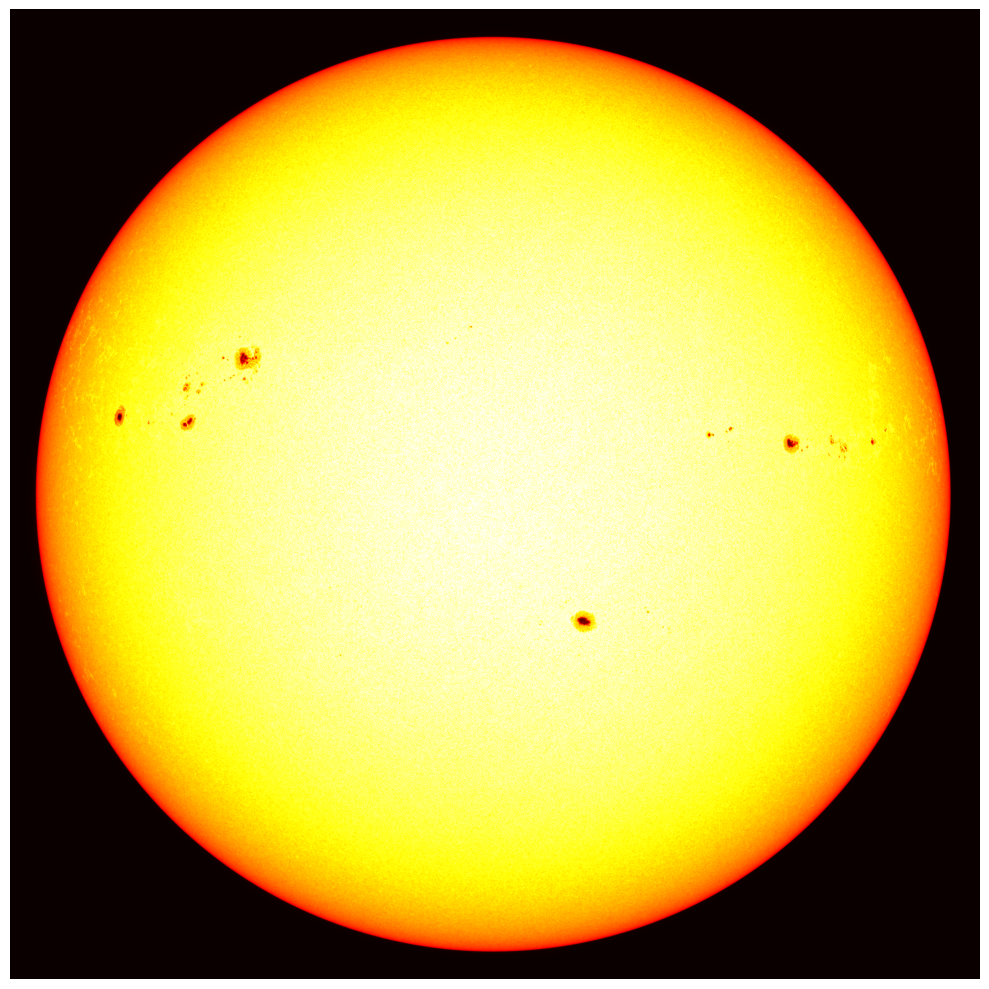

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from sunpy.net import Fido, attrs as a
from sunpy.map import Map

# Fetch SDO/HMI continuum intensity (photosphere brightness) at 45s cadence. A minute will get one for sure. 
result = Fido.search(a.Time('2024-12-01 12:00', '2024-12-01 12:01'),
                     a.Instrument('HMI'), 
                     a.Physobs('intensity'))
files = Fido.fetch(result)

# Load as array
smap = Map(files[0])
data = np.nan_to_num(smap.data, nan=0)  # or use np.nanmean(smap.data) instead of 0

# Convert DN/s to brightness temperature (K)
# Empirical: T ≈ 4500 + (DN/s - 45000) * 0.02
T_bright_fulldisk = 4500 + (data - 45000) * 0.02

# Apply your custom colormap
valid = data[data > 0]  # for percentile calculation on disk only
plt.figure(figsize=(10, 10))
plt.imshow(data, origin='lower', vmin=np.percentile(valid, 1), vmax=np.percentile(valid, 99), cmap='hot')
plt.axis('off')
plt.tight_layout()

# Raw array for your own processing
print(f"Shape: {data.shape}, dtype: {data.dtype}")
print(f"Range: [{data.min():.1f}, {data.max():.1f}]")

In [130]:
# How many times to grab? A day is 1920 images What did it look like a day earlier? 

60*60*24 /45

1920.0

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

hmi.ic_45s.2024.11.28_12_01_30_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

Shape: (4096, 4096), dtype: float32
Range: [0.0, 54041.0]


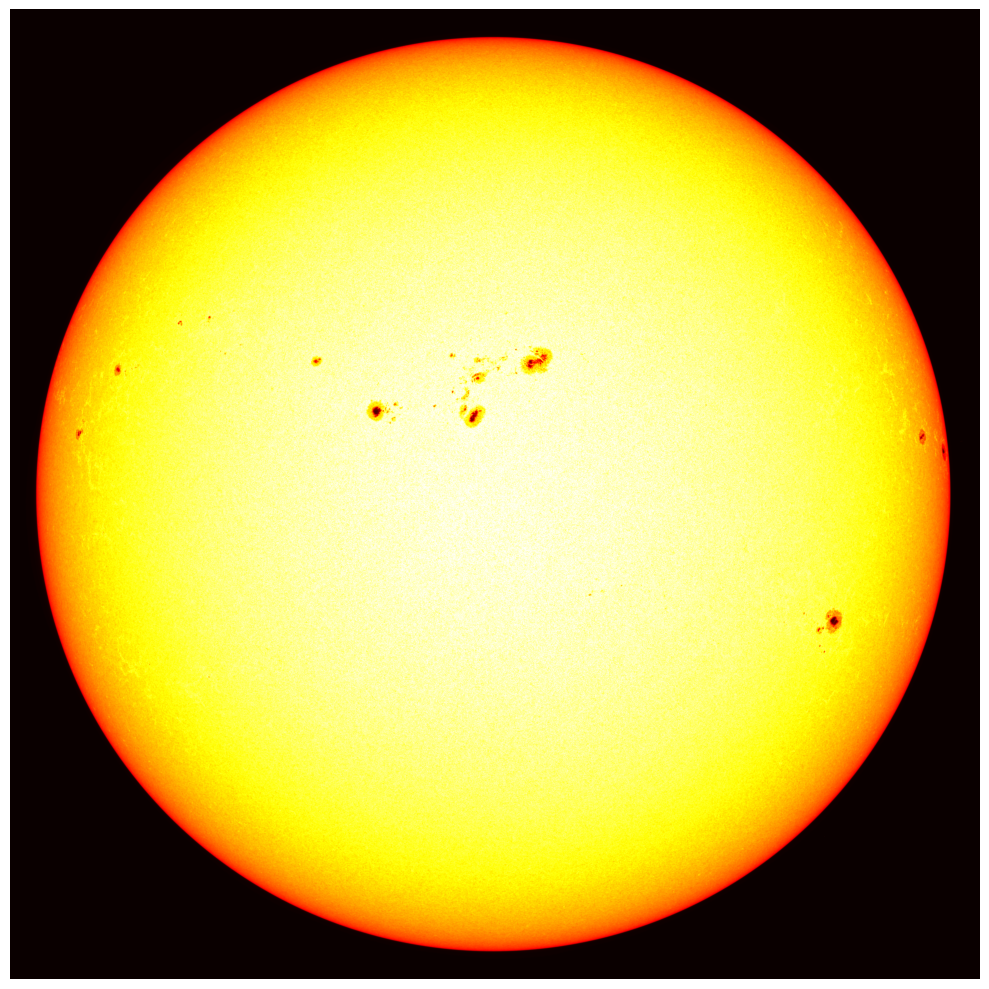

In [134]:
import numpy as np
import matplotlib.pyplot as plt
from sunpy.net import Fido, attrs as a
from sunpy.map import Map

# Fetch SDO/HMI continuum intensity (photosphere brightness) at 45s cadence. A minute will get one for sure. 
result = Fido.search(a.Time('2024-11-28 12:00', '2024-11-28 12:01'),
                     a.Instrument('HMI'), 
                     a.Physobs('intensity'))
files = Fido.fetch(result)

# Load as array
smap = Map(files[0])
data = np.nan_to_num(smap.data, nan=0)  # or use np.nanmean(smap.data) instead of 0

# Convert DN/s to brightness temperature (K)
# Empirical: T ≈ 4500 + (DN/s - 45000) * 0.02
T_bright_fulldisk = 4500 + (data - 45000) * 0.02

# Apply your custom colormap
valid = data[data > 0]  # for percentile calculation on disk only
plt.figure(figsize=(10, 10))
plt.imshow(data, origin='lower', vmin=np.percentile(valid, 1), vmax=np.percentile(valid, 99), cmap='hot')
plt.axis('off')
plt.tight_layout()

# Raw array for your own processing
print(f"Shape: {data.shape}, dtype: {data.dtype}")
print(f"Range: [{data.min():.1f}, {data.max():.1f}]")

In [109]:
# Custom colormap matching project at cold end 
from matplotlib.colors import LinearSegmentedColormap, to_rgba

color_points = [
    (190, "#dc05ef", 1.0),  # magenta 
    (222, "#0589ef", 1.0),  # blue
    (244, "#00ffff", 1.0),  # cyan
    (255, "#716f6f", 1.0),  # darker gray 
    (270, "#E3DEDE", 1.0),  # light-mid gray
    (285, "#78133D", 1.0),  # darkish lilac
    (290, "#8F0105", 1),   # very hot dark red
    (300, "#F71105", 1),   # very hot red
    (320, "#ff8000", 1),  # hot orange
    (330, "#F5C227", 1.0),  # yellow-orange
    (340, "#FAFA02", 1.0),  # yellow
]
vmin, vmax = 190, 340
custom_cmap = LinearSegmentedColormap.from_list("custom", [
    ((v - vmin) / (vmax - vmin), to_rgba(c, a)) for v, c, a in color_points
])

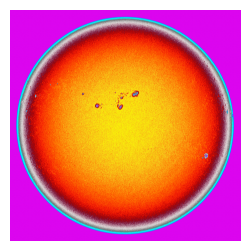

In [135]:
T_bright = 4500 + (data - 45000) * 0.02

plt.figure(figsize=(3,3))
plt.imshow(T_bright_fulldisk, origin='lower', vmin=3800, vmax=4550, cmap = custom_cmap);
plt.axis('off');
            #vmin=np.percentile(valid, 1), vmax=np.percentile(valid, 99), cmap='hot')


# Animation of a limited area 

This grabs the center 2048×2048 region. Adjust the pixel ranges to target your area of interest (full images are typically 4096×4096). Samples are every 45 seconds ! 

Now you'll get brightness temperatures! Typical values:

Quiet photosphere: ~4400-4600 K
Granule centers (hot): ~4600-4800 K
Intergranular lanes (cool): ~4200-4400 K
Sunspots: ~3500-4000 K

The conversion is approximate but reasonable for continuum intensity at 6173 Å.

In [138]:
# Find time blocks with good data 
from sunpy.net import Fido, attrs as a
from astropy import units as u

# Search a large window to see what's available
result = Fido.search(a.Time('2024-11-29', '2024-12-02'),  # 1 day window
                     a.Instrument('HMI'), 
                     a.Physobs('intensity'))

print(f"Found {len(result[0])} files")
print(f"First: {result[0]['Start Time'][0]}")
print(f"Last: {result[0]['Start Time'][-1]}")

# Find a continuous 10-minute block (13+ frames at 45s)
times = result[0]['Start Time']
for i in range(len(times) - 13):
    block = times[i:i+13]
    # Check if continuous (all < 50s apart)
    gaps = [(block[j+1] - block[j]).sec for j in range(len(block)-1)]
    if all(g < 50 for g in gaps):
        print(f"\nClean block found starting at: {block[0]}")
        # Now fetch just this block
        files = Fido.fetch(result[0][i:i+13])
        break
        

Found 145 files
First: 2024-11-29 00:00:23.000
Last: 2024-12-01 23:58:53.000


In [144]:
from sunpy.net import Fido, attrs as a
from astropy import units as u
import numpy as np

# Search with explicit 45s cadence
result = Fido.search(a.Time('2024-11-29', '2024-11-30'),  # Try just 1 day first
                     a.Instrument('HMI'), 
                     a.Physobs('intensity'),
                     a.Sample(45*u.s))

df = result[0][['Start Time', 'End Time']].to_pandas()  # Just get the time columns
print(f"Total files found: {len(df)}")

# Calculate gaps between consecutive observations
df['Start Time'] = df['Start Time'].astype('datetime64[ns]')
df = df.sort_values('Start Time')
gaps = df['Start Time'].diff().dt.total_seconds()

# Find longest stretch with gaps < 120 seconds
max_len = 0
max_start = 0
current_len = 1
current_start = 0

for i, gap in enumerate(gaps[1:], 1):
    if gap < 120:  # Less than 2 min gap
        current_len += 1
    else:
        if current_len > max_len:
            max_len = current_len
            max_start = current_start
        current_len = 1
        current_start = i

# Check final stretch
if current_len > max_len:
    max_len = current_len
    max_start = current_start

print(f"\nLongest continuous period: {max_len} frames")
print(f"Starting at: {df.iloc[max_start]['Start Time']}")
print(f"Ending at: {df.iloc[max_start + max_len - 1]['Start Time']}")
print(f"Duration: {(df.iloc[max_start + max_len - 1]['Start Time'] - df.iloc[max_start]['Start Time']).total_seconds()/3600:.1f} hours")

# Fetch this clean block
clean_result = result[0][max_start:max_start + max_len]
print(f"\nFetching {len(clean_result)} files...")
# files = Fido.fetch(clean_result)

Total files found: 1920

Longest continuous period: 1920 frames
Starting at: 2024-11-29 00:00:23
Ending at: 2024-11-29 23:59:38
Duration: 24.0 hours

Fetching 1920 files...


In [139]:
result

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size,Extra Flags
,,,,Angstrom,,,,,,,Mibyte,
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64,str1
2024-11-29 00:00:23.000,2024-11-29 00:28:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 00:28:53.000,2024-11-29 00:58:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 00:58:53.000,2024-11-29 01:28:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 01:28:53.000,2024-11-29 01:58:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 01:58:53.000,2024-11-29 02:28:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 02:28:53.000,2024-11-29 02:58:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 02:58:53.000,2024-11-29 03:28:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S
2024-11-29 03:28:53.000,2024-11-29 03:58:09.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098,S


Files Downloaded:   0%|          | 0/93 [00:00<?, ?file/s]

hmi.ic_45s.2024.12.01_11_01_30_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_54_45_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_54_00_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_55_30_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_18_00_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_42_00_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_56_15_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_57_00_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_57_45_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_58_30_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_11_59_15_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_12_00_00_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

hmi.ic_45s.2024.12.01_12_00_45_TAI.continuum.fits:   0%|          | 0.00/16.0M [00:00<?, ?B/s]

2025-12-15 13:10:55 - parfive - INFO: http://netdrms01.nispdc.nso.edu/cgi-bin/netdrms/drms_export.cgi?series=hmi__Ic_45s;compress=rice;record=22382323-22382323 failed to download with exception
Download Failed: http://netdrms01.nispdc.nso.edu/cgi-bin/netdrms/drms_export.cgi?series=hmi__Ic_45s;compress=rice;record=22382323-22382323 with error <ClientResponse(http://netdrms01.nispdc.nso.edu/cgi-bin/netdrms/drms_export.cgi?series=hmi__Ic_45s;compress=rice;record=22382323-22382323) [500 Internal Server Error]>
<CIMultiDictProxy('Date': 'Mon, 15 Dec 2025 18:09:13 GMT', 'Server': 'Apache/2.2.15 (CentOS)', 'Content-Length': '624', 'Connection': 'close', 'Content-Type': 'text/html; charset=iso-8859-1')>

2025-12-15 13:10:55 - parfive - INFO: http://netdrms01.nispdc.nso.edu/cgi-bin/netdrms/drms_export.cgi?series=hmi__Ic_45s;compress=rice;record=22382324-22382324 failed to download with exception
Download Failed: http://netdrms01.nispdc.nso.edu/cgi-bin/netdrms/drms_export.cgi?series=hmi__Ic_45s;

67/0 files failed to download. Please check `.errors` for details


2025-12-15 13:11:01 - matplotlib.animation - INFO: Animation.save using <class 'matplotlib.animation.HTMLWriter'>


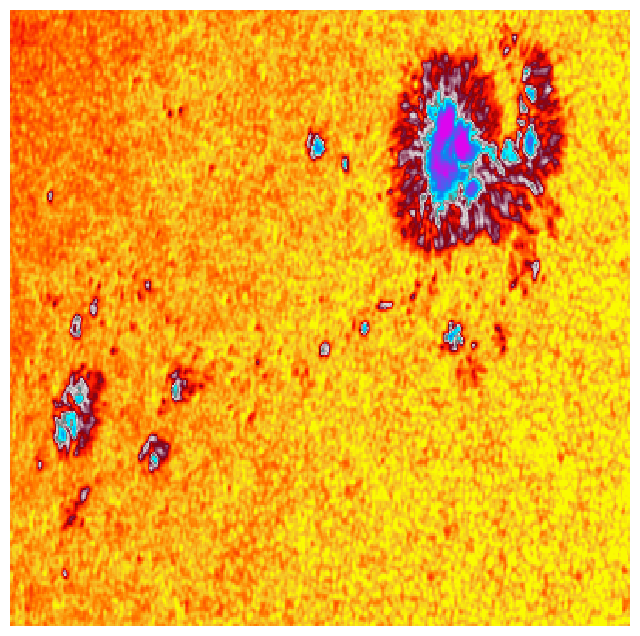

In [137]:
import numpy as np
import matplotlib.pyplot as plt
from sunpy.net import Fido, attrs as a
from sunpy.map import Map
from astropy import units as u

# Fetch 70 minutes of data (at 45s cadence)
result = Fido.search(a.Time('2024-12-01 12:00', '2024-12-01 12:10'),
                     a.Instrument('HMI'), a.Physobs('intensity'))
files = Fido.fetch(result)

# Process subregion (center disk, 500x500 arcsec)
frames = []
for f in files:
    smap = Map(f)
    sub = smap.submap(bottom_left=[1024, 1024]*u.pixel, 
                      top_right=[3072, 3072]*u.pixel)
    
    # closer! x first, then y: [x, y]
    sub = smap.submap(bottom_left=[700,  2400]*u.pixel, 
                        top_right=[1100, 2685]*u.pixel)  # 400 x 285 is 5x7 aspect 

    data = np.nan_to_num(sub.data, nan=0)
    # Convert DN/s to brightness temperature (K)
    # Empirical: T ≈ 4500 + (DN/s - 45000) * 0.02
    T_bright = 4500 + (data - 45000) * 0.02
    frames.append(T_bright)

# Animate
from matplotlib.animation import FuncAnimation
fig, ax = plt.subplots(figsize=(8, 8))
vmin, vmax = np.percentile(frames[0][frames[0]>0], 1), np.percentile(frames[0][frames[0]>0], 99)
im = ax.pcolormesh(frames[0], vmin=3800, vmax=4500, cmap = custom_cmap)
ax.axis('off')
#plt.colorbar(im, ax=ax, label='Brightness Temperature (K)', fraction=0.046)

def update(i):
    im.set_array(frames[i])
    return [im]

anim = FuncAnimation(fig, update, frames=len(frames), interval=100, blit=True)
from IPython.display import HTML
HTML(anim.to_jshtml())


In [35]:
np.shape(frames)

(13, 401, 401)

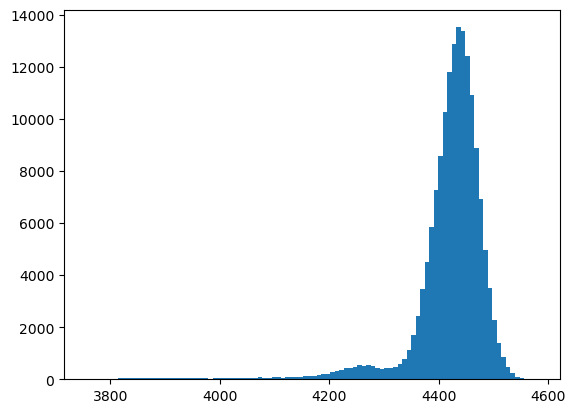

In [39]:
plt.hist(frames[0].ravel(), bins=100); 

In [107]:
# Custom colormap with transparency
from matplotlib.colors import LinearSegmentedColormap, to_rgba

color_points = [
    (190, "#dc05ef", 1.0),  # magenta 
    (222, "#0589ef", 1.0),  # blue
    (244, "#00ffff", 1.0),  # cyan
    (255, "#716f6f", 1.0),  # darker gray 
    (270, "#E3DEDE", 1.0),  # light-mid gray
    (285, "#78133D", 1.0),  # darkish lilac
    (290, "#8F0105", 1),   # very hot dark red
    (300, "#F71105", 1),   # very hot red
    (320, "#ff8000", 1),  # hot orange
    (330, "#F5C227", 1.0),  # yellow-orange
    (340, "#FAFA02", 1.0),  # yellow
]
vmin, vmax = 190, 340
custom_cmap = LinearSegmentedColormap.from_list("custom", [
    ((v - vmin) / (vmax - vmin), to_rgba(c, a)) for v, c, a in color_points
])

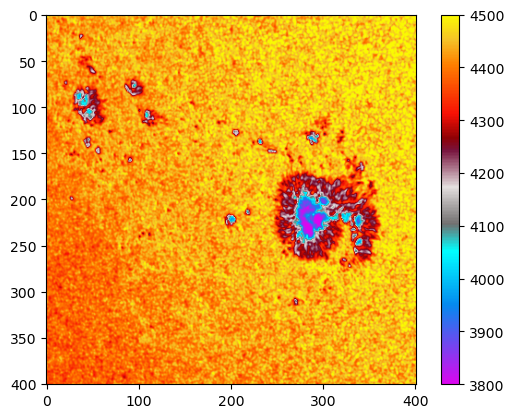

In [108]:
plt.imshow(frames[0], vmin=3800, vmax=4500, cmap = custom_cmap);
plt.colorbar();